### Download Test image

In [1]:
!wget https://www.sciencenews.org/wp-content/uploads/2020/03/033120_HT_covid-cat_feat-1028x579.jpg
!ls -lia

--2025-09-03 17:13:01--  https://www.sciencenews.org/wp-content/uploads/2020/03/033120_HT_covid-cat_feat-1028x579.jpg
Resolving www.sciencenews.org (www.sciencenews.org)... 108.156.60.97, 108.156.60.12, 108.156.60.81, ...
Connecting to www.sciencenews.org (www.sciencenews.org)|108.156.60.97|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 61745 (60K) [image/jpeg]
Saving to: ‘033120_HT_covid-cat_feat-1028x579.jpg’

033120_HT_covid-cat 100%[===================>]  60.30K  --.-KB/s    in 0.01s   

2025-09-03 17:13:01 (4.40 MB/s) - ‘033120_HT_covid-cat_feat-1028x579.jpg’ saved [61745/61745]

total 124
   786446 drwxr-xr-x 2 root root  4096 Sep  3 17:13 .
150104884 drwxr-xr-x 8 root root  4096 Sep  3 17:12 ..
   786448 -rw-r--r-- 1 root root 61745 Mar 31  2020 033120_HT_covid-cat_feat-1028x579.jpg
   786447 ---------- 1 root root 52478 Sep  3 17:13 __notebook__.ipynb


In [2]:
### Visualize with PIL and apply torch transforms

<class 'PIL.JpegImagePlugin.JpegImageFile'>


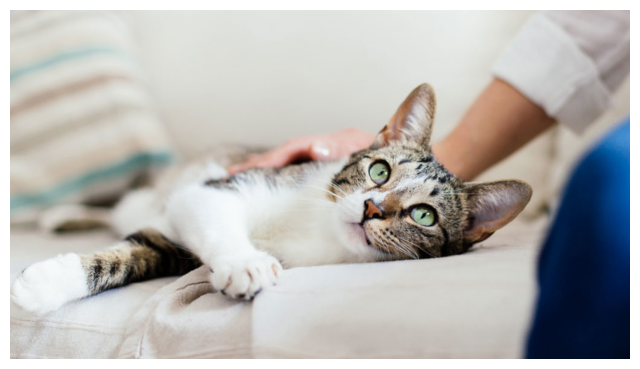

In [3]:
import matplotlib.pyplot as plt
from PIL import Image

org_img_pil = Image.open('033120_HT_covid-cat_feat-1028x579.jpg')

def show_image(image):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    
show_image(org_img_pil)
print(type(org_img_pil))


<class 'PIL.Image.Image'>


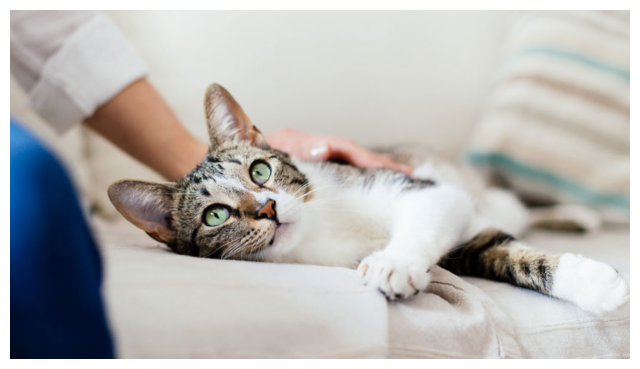

In [4]:
from torchvision import transforms as T

# Create a transforms RandomHorizontalFlip object for left-right flipping.
transform = T.RandomHorizontalFlip(p=1)

# Perform left-right flipping. Accepts a PIL object or Tensor object as input.
# When given a PIL input, it returns a flipped PIL image.
aug_img = transform(org_img_pil)

print(type(aug_img))
show_image(aug_img)


### Numpy array read by OpenCV cannot be applied to transforms

* `cv2.imread(filename)` reads an image file into a numpy array with shape `(height, width, channels)` in channel-last format.
* The channel order read by `imread()` is not **RGB** but **BGR**. To convert this into RGB, use `cv2.cvtColor(array, cv2.COLOR_BGR2RGB)`.


<class 'numpy.ndarray'> (579, 1028, 3)


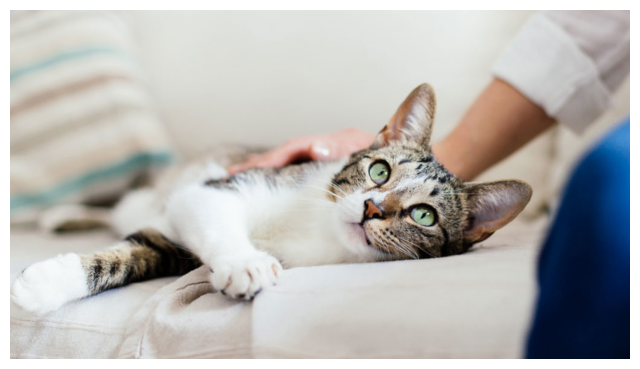

In [5]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

org_img_numpy = cv2.cvtColor(cv2.imread('033120_HT_covid-cat_feat-1028x579.jpg'), cv2.COLOR_BGR2RGB)

def show_image(image):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    
show_image(org_img_numpy)
print(type(org_img_numpy), org_img_numpy.shape)


In [6]:
from torchvision import transforms as T
import cv2

# OpenCV reads images in (h, w, c) format, i.e., channel last. 
# Also, the values are in unsigned int type.
org_img_numpy = cv2.cvtColor(cv2.imread('033120_HT_covid-cat_feat-1028x579.jpg'), cv2.COLOR_BGR2RGB)

print(type(org_img_numpy), org_img_numpy.dtype)
# Create a horizontal flip transform object.
transform = T.RandomHorizontalFlip(p=1)

# transforms require input as either PIL or PyTorch tensor.
# the following code will occur an error
# aug_img = transform(org_img_numpy)

# print(type(aug_img))
# show_image(aug_img)


<class 'numpy.ndarray'> uint8


### Numpy array를 torchvision transforms에 부득이하게 사용해야 할 경우
* numpy array를 PIL이나 Tensor로 변환
* Tensor변환 시 Channel Last numpy array가 Channel First Tensor로 변환이 되어야 함. 

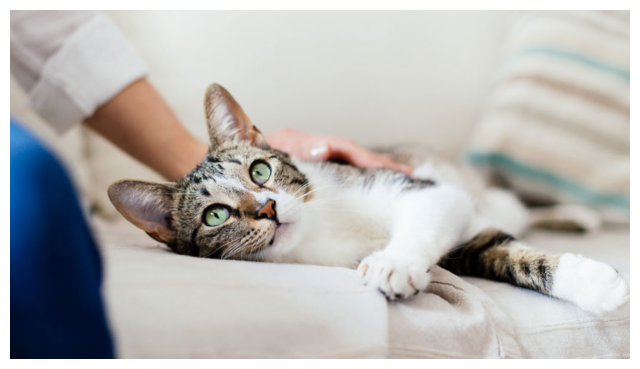

In [7]:
'''
Convert a Numpy array to PIL and then apply transforms
'''
# OpenCV reads the image as (h, w, c), which means channel-last. The values are of unsigned int type.
org_img_numpy = cv2.cvtColor(cv2.imread('033120_HT_covid-cat_feat-1028x579.jpg'), cv2.COLOR_BGR2RGB)

# Convert numpy array to a PIL object
org_img_pil = Image.fromarray(org_img_numpy)

# Create a horizontal flip transform object
transform = T.RandomHorizontalFlip(p=1)
aug_img = transform(org_img_pil)

show_image(aug_img)


<class 'torch.Tensor'> torch.float32 torch.Size([3, 579, 1028])
<class 'torch.Tensor'> torch.float32 torch.Size([3, 579, 1028])
<class 'PIL.Image.Image'>


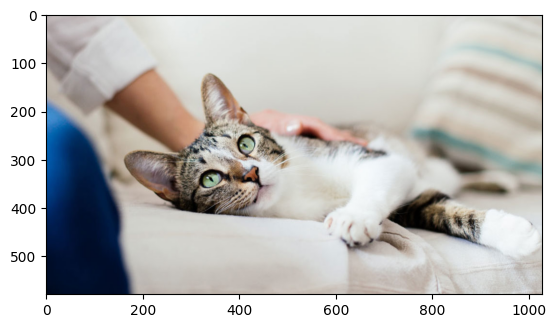

In [8]:
'''
Convert Numpy array to Tensor and then apply Transforms.
Change Channel Last -> Channel First and convert dtype to float32
'''
import torch

org_img_numpy = cv2.cvtColor(cv2.imread('033120_HT_covid-cat_feat-1028x579.jpg'), cv2.COLOR_BGR2RGB)

# Convert numpy to tensor, switch to channel-first, and change unsigned int uint8 values to float32
org_img_tensor = torch.tensor(org_img_numpy).permute(2, 0, 1).to(torch.float32)
print(type(org_img_tensor), org_img_tensor.dtype, org_img_tensor.shape)

# Create a horizontal flip transform object
transform = T.RandomHorizontalFlip(p=1)
aug_img_tensor = transform(org_img_tensor)
print(type(aug_img_tensor), aug_img_tensor.dtype, aug_img_tensor.shape)

# For visualization, convert back to PIL. When applying ToPILImage(), the tensor must be channel-first and dtype converted to uint8
to_pil = T.ToPILImage()
aug_pil_image = to_pil(aug_img_tensor.to(torch.uint8))

print(type(aug_pil_image))
# show_image(aug_img)
plt.imshow(aug_pil_image)


### Applying Augmentation Probabilities with RandomHorizontalFlip and RandomVerticalFlip

* The `p` parameter sets the probability of applying the augmentation versus keeping the original image unchanged.
* `RandomHorizontalFlip` performs left-right flipping, while `RandomVerticalFlip` performs top-bottom flipping.
* These are considered **weak augmentations** → however, stronger augmentations are not always better, since in real scenarios such heavily transformed images may not appear as input data and could actually reduce performance.


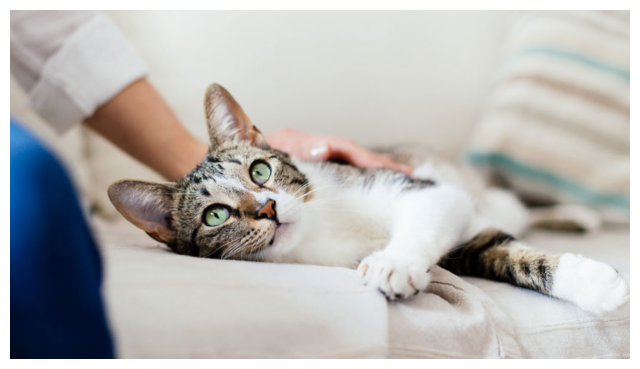

In [9]:
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms as T
#from torchvision.transforms import v2

org_img_pil = Image.open('033120_HT_covid-cat_feat-1028x579.jpg')
transforms_h = T.RandomHorizontalFlip(p=0.5)
aug_img = transforms_h(org_img_pil)

show_image(aug_img)

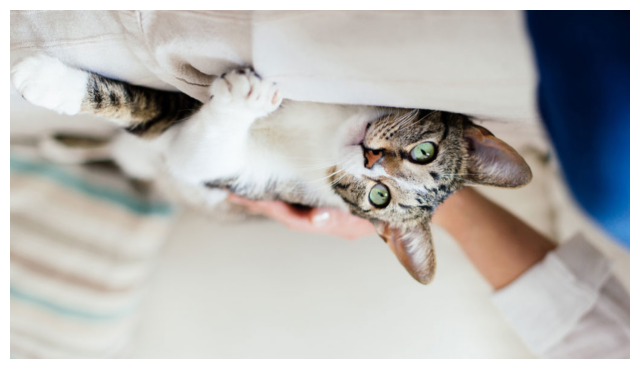

In [10]:
# Vertical Filp
transform_v = T.RandomVerticalFlip(p=0.5)
aug_img = transform_v(org_img_pil)
show_image(aug_img)

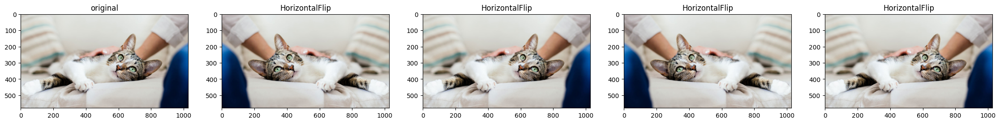

In [11]:
# Visualize multiple images using subplots
def show_images(images, labels, ncols=5, title=None):
    figure, axs = plt.subplots(figsize=(28, 6), nrows=1, ncols=ncols)
    for i in range(ncols):
        axs[i].imshow(images[i])
        axs[i].set_title(labels[i])

# Repeat augmentation using the given albumentations transform
def repeat_aug(count=4, org_image=None, label=None, transform=None):
    image_list = [org_image]
    label_list = ['original']

    for i in range(count):
        aug_image = transform(org_image)
        image_list.append(aug_image)
        label_list.append(label)
        
    show_images(image_list, label_list, ncols=count+1)
    
    
transform = T.RandomHorizontalFlip(p=0.5)
repeat_aug(count=4, org_image=org_img_pil, label='HorizontalFlip', transform=transform)


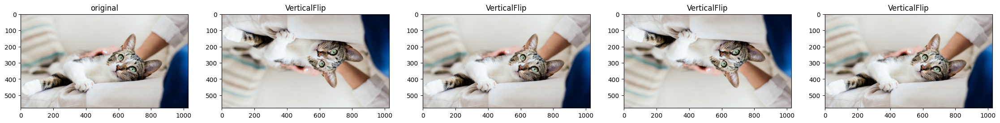

In [12]:
# Sequential application of vertical flip
transform = T.RandomVerticalFlip(p=0.5)

repeat_aug(count=4, org_image=org_img_pil, label='VerticalFlip', transform=transform)


### Applying Multiple Augmentations Sequentially with Compose()

* You can pass a list of transform objects as arguments to apply multiple augmentations in sequence.


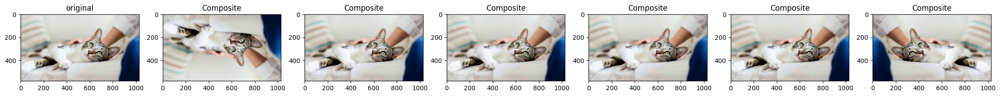

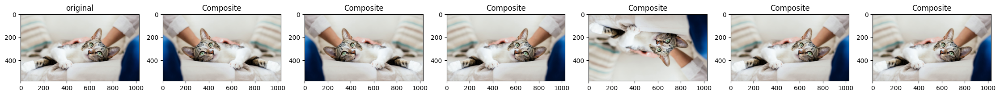

In [13]:
transform = T.Compose([
    T.RandomVerticalFlip(p=0.5),
    T.RandomHorizontalFlip(p=0.5)
    ])

repeat_aug(count=6, org_image=org_img_pil, label='Composite', transform=transform)
repeat_aug(count=6, org_image=org_img_pil, label='Composite', transform=transform)

### CenterCrop, RandomCrop, RandomResizedCrop

* **Crop** cuts out a specific region of the original image of the given height and width without resizing back to the original size.
* **CenterCrop** crops a region of the given height and width centered on the original image (does not resize to the original image size).
* **RandomCrop** randomly crops a region of the given height and width (does not resize to the original image size).
* **RandomResizedCrop** randomly crops a region of the original image and then resizes it to the specified height and width.
* With **RandomResizedCrop**, the exact cropped region is unpredictable; the scale and ratio parameters roughly control how much and which part is cropped.
* CenterCrop, RandomCrop, and RandomResizedCrop do **not** have a probability parameter. To apply them conditionally, you can use **RandomApply**.
* Since CenterCrop and RandomCrop do not resize, you need to apply an additional resize transform to match the input size expected by a PyTorch model.


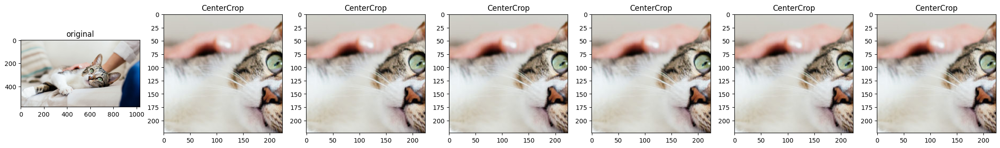

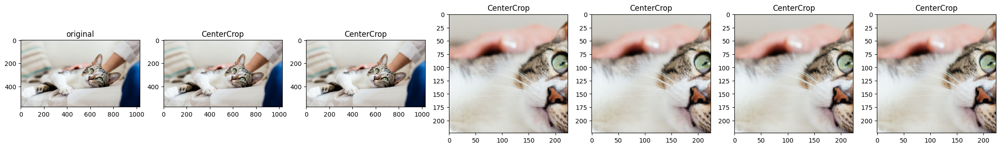

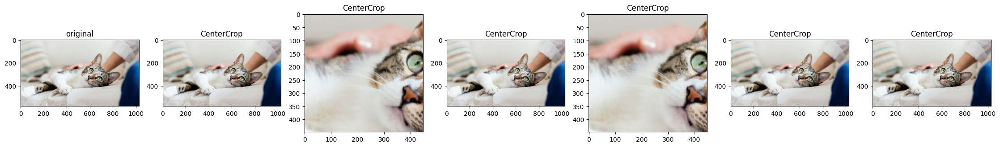

In [14]:
# CenterCrop extracts a region of the specified size from the center of the original image.
# It does not have a probability parameter. To apply it conditionally, you need to wrap it with RandomApply.
transform = T.CenterCrop(size=(224, 224)) # or size=224
repeat_aug(count=6, org_image=org_img_pil, label='CenterCrop', transform=transform)

# Since it does not have a probability parameter, you need to wrap it with RandomApply. 
# RandomApply() requires a List as input, and its default probability p is 0.5.
transform = T.RandomApply([T.CenterCrop(size=(224, 224))], p=0.5)
repeat_aug(count=6, org_image=org_img_pil, label='CenterCrop', transform=transform)

# Because the final image is produced, you may need to resize it again to another size using Resize.
transform = T.RandomApply([T.CenterCrop(size=(224, 224)), T.Resize(size=(448, 448))], p=0.5)
repeat_aug(count=6, org_image=org_img_pil, label='CenterCrop', transform=transform)


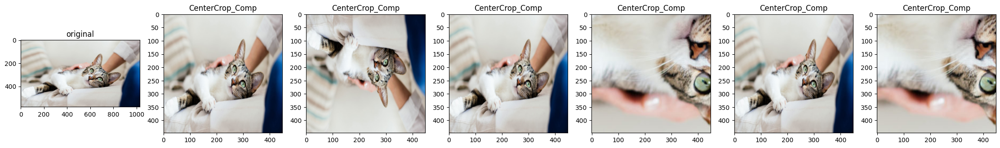

In [15]:
# If crop-type transformations such as CenterCrop, RandomCrop, or Crop are used in the Compose chain,
# a final Resize transformation is needed to ensure a fixed image size.
transform = T.Compose([
    T.RandomVerticalFlip(p=0.5),
    T.RandomApply([T.CenterCrop(size=(224, 224))], p=0.5),
    T.Resize(size=(448, 448))
    ])

repeat_aug(count=6, org_image=org_img_pil, label='CenterCrop_Comp', transform=transform)


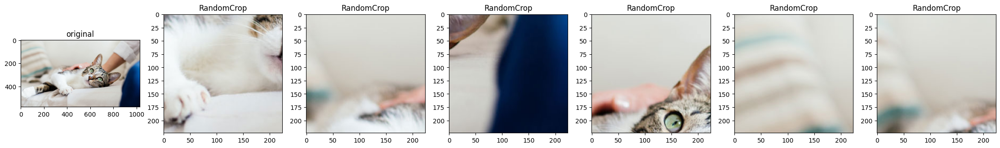

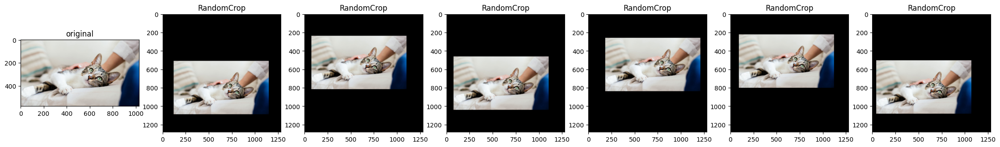

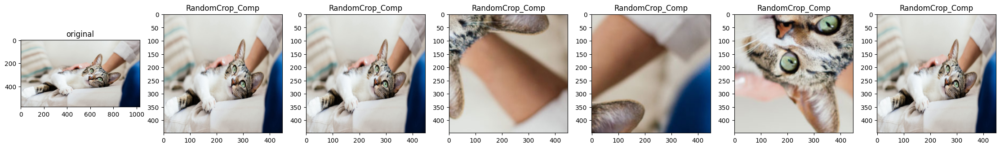

In [16]:
transform = T.RandomCrop(size=(224, 224))
repeat_aug(count=6, org_image=org_img_pil, label='RandomCrop', transform=transform)

transform = T.RandomCrop(size=(1280, 1280), pad_if_needed=True) #  padding_mode: 'constant', 'edge', 'reflect', 'symmetric'
repeat_aug(count=6, org_image=org_img_pil, label='RandomCrop', transform=transform)

transform = T.Compose([
    T.RandomVerticalFlip(p=0.5),
    T.RandomApply([T.RandomCrop(size=(224, 224))], p=0.5),
    T.Resize(size=(448, 448))
    ])

repeat_aug(count=6, org_image=org_img_pil, label='RandomCrop_Comp', transform=transform)

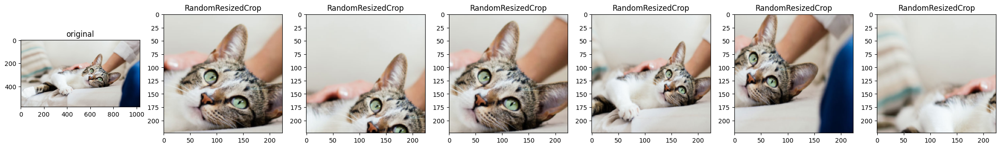

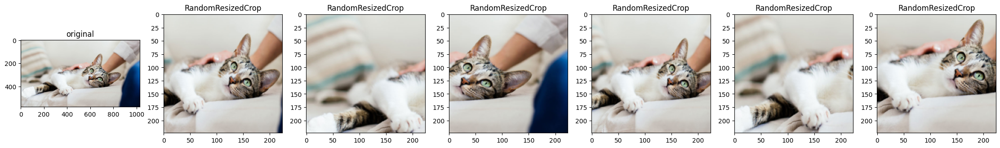

In [17]:
# RandomResizedCrop cuts a random region of the original image and resizes it to the specified height and width.
# RandomResizedCrop does not specify exactly which region or how much will be cropped; instead,
# it roughly adjusts using scale and ratio.
# scale defines the proportion of the total image to crop (min, max),
# ratio defines the aspect ratio (e.g., 0.75=3:4 taller, 1.333=4:3 wider).
transform = T.RandomResizedCrop(size=(224, 224)) # default scale is (0.08, 1.0), ratio is (0.75, 1.333)
repeat_aug(count=6, org_image=org_img_pil, label='RandomResizedCrop', transform=transform)

# The scale parameter can be applied to reduce variability in the cropped region.
transform = T.RandomResizedCrop(size=(224, 224), scale=(0.3, 0.8))
repeat_aug(count=6, org_image=org_img_pil, label='RandomResizedCrop', transform=transform)


### RandomRotation

* Rotates within a specified range of degrees. For example, `degrees=90` or `(-90, 90)` means random rotation between -90° and 90°.
* Since it does not have a `p` parameter, it must be applied using **RandomApply**.


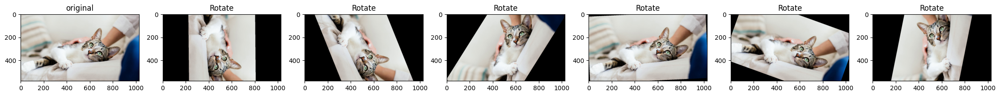

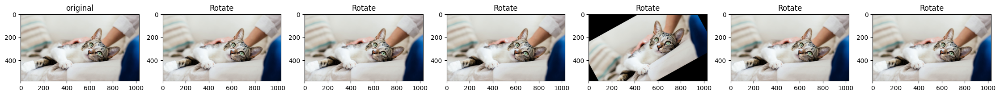

In [18]:
transform = T.RandomRotation(degrees=90)  # degrees=(-90, 90), if expand=True the image size is increased to include the entire rotated image
repeat_aug(count=6, org_image=org_img_pil, label='Rotate', transform=transform)

transform = T.RandomApply([T.RandomRotation(degrees=90)], p=0.5)
repeat_aug(count=6, org_image=org_img_pil, label='Rotate', transform=transform)


### RandomAffine

* Applies rotation, shift (vertical/horizontal translation), and scale (image resizing) together. Each transformation is applied randomly.
* Since it does not have a `p` parameter, it should be wrapped with `RandomApply`.


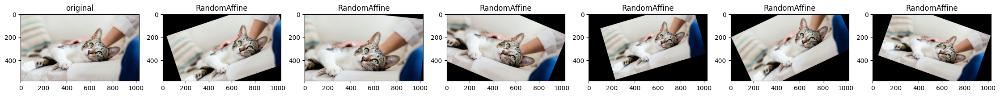

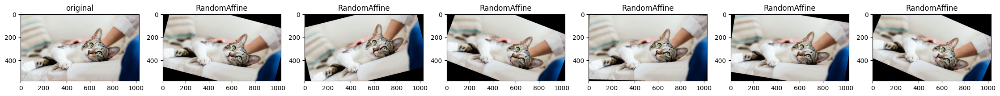

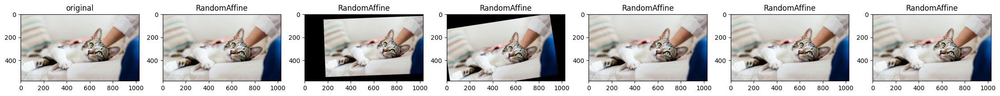

In [19]:
transform = T.RandomAffine(degrees=30, # Random rotation between -30 and 30 degrees
                            translate=(0.1, 0.1), # Random shift horizontally and vertically up to 10% of the image
                            scale=(0.8, 1.2)) # Randomly scale the image between 80% and 120%. Try scale=(0.1, 1.5)
repeat_aug(count=6, org_image=org_img_pil, label='RandomAffine', transform=transform)

# To apply only a specific transformation, set values only for that transformation and use None for the others.
# Below, only degrees is applied.
transform = T.RandomAffine(degrees=30, # Random rotation between -30 and 30 degrees
                            translate=None, # No random shift horizontally or vertically
                            scale=None) # No random scaling applied
repeat_aug(count=6, org_image=org_img_pil, label='RandomAffine', transform=transform)

transform = T.RandomApply([T.RandomAffine(degrees=30, 
                            translate=(0.1, 0.1),
                            scale=(0.8, 1.2))], p=0.5) 
repeat_aug(count=6, org_image=org_img_pil, label='RandomAffine', transform=transform)


### ColorJitter

* Randomly changes brightness, contrast, saturation, and hue together.
* Does not have a probability parameter, so use `RandomApply` to set probability.


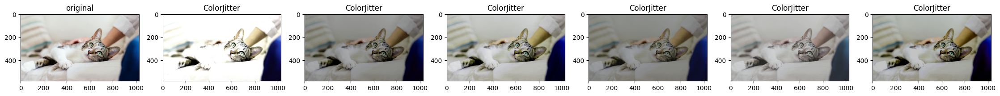

In [20]:
transform = T.ColorJitter(brightness=0.5, # Adjusts brightness to a range of (1-0.5 ~ 1+0.5), with a minimum value of 0. [max(0, 1 - brightness), 1 + brightness] 
                           contrast=0.5,  # Adjusts contrast to a range of (1-0.5 ~ 1+0.5), with a minimum value of 0.  
                           saturation=0.5, # Adjusts saturation to a range of (1-0.5 ~ 1+0.5), with a minimum value of 0.  
                           hue=0.1         # Adjusts hue to a range of -0.1 ~ 0.1, with a minimum of -0.5 and a maximum of 0.5
                          )
repeat_aug(count=6, org_image=org_img_pil, label='ColorJitter', transform=transform)


### GaussianBlur

* Blur applies a filter to make overall edges softer or to remove noise (smoothing).
* A typical blur averages pixel values within the filter kernel size. Gaussian Blur, however, generates kernel values using a Gaussian function.
* The larger the kernel size, the blurrier the image becomes. In the case of Gaussian blur, the kernel size must be an odd number.


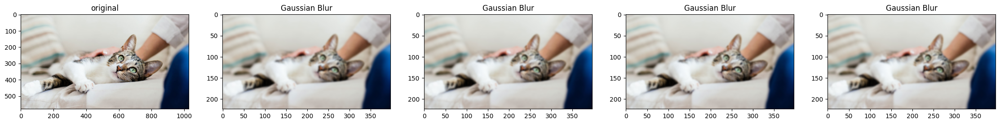

In [21]:
transform = T.Compose(
    [T.Resize(size=224), T.GaussianBlur(kernel_size=(7, 7))])
repeat_aug(count=4, org_image=org_img_pil, label='Gaussian Blur', transform=transform)

### Applying One of Several Transformations with RandomChoice

* Used mainly to select one transformation among those that produce strong variations.
* RandomChoice always selects exactly one transform from the given list. To apply RandomChoice itself with a probability, wrap it with **RandomApply**.


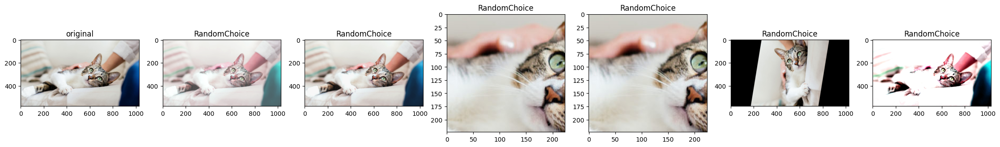

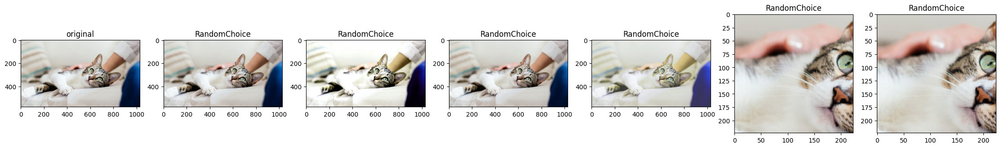

In [22]:

transform = T.RandomChoice([T.CenterCrop(size=224),
                             T.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1),
                             T.RandomRotation(degrees=90)],
                           p=[0.5, 0.3, 0.2])
repeat_aug(count=6, org_image=org_img_pil, label='RandomChoice', transform=transform)

transform = T.RandomApply([
                           T.RandomChoice([T.CenterCrop(size=224),
                                            T.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1),
                                            T.RandomRotation(degrees=90)],
                                           p=[0.5, 0.3, 0.2])
                           ], p=0.5)
repeat_aug(count=6, org_image=org_img_pil, label='RandomChoice', transform=transform)

### Notes on Applying ToTensor and Normalize

* **ToTensor()** takes a PIL image or a Numpy array as input and returns a Tensor. A Tensor must not be passed as input. The pixel values are scaled to the range **0–1**.
* **Normalize()** requires a Tensor as input.


In [23]:
transform = T.Compose([
    T.RandomHorizontalFlip(p=0.5),
    T.RandomApply([T.RandomAffine(degrees=30, translate=(0.1, 0.1),scale=(0.8, 1.2))
                   ], p=0.2),
    T.ToTensor(),# if it's not tensor, an error will occur
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
aug_img = transform(org_img_pil)
print(type(aug_img))


<class 'torch.Tensor'>


### Apply Augmentation and Train Models Using the Flowers Dataset

* Verify how different augmentations affect model performance.
* Start with light augmentations, and later apply heavier augmentations.


#### Download the Flowers Dataset and Generate Metadata

* The dataset consists of 3,670 images used to classify flower types (daisy, dandelion, rose, sunflower, tulip).
* Each subdirectory is named after the flower type.
* Split the dataset into 70% training and 30% testing, then further divide the training data into 80% training and 20% validation.


In [24]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

def create_flowers_meta_df(file_dir):
    paths = [] # list of image file paths
    labels = [] # flower types
    
    # Use os.walk() to traverse all subdirectories under a specific directory.
    # All files with .jpg extension under kaggle/input/flowers-dataset are image files.
    # Subdirectories exist under kaggle/input/flowers-dataset.
    for dirname, _, filenames in os.walk(file_dir):
        for filename in filenames:
            # There may also be non-image files in the directory.
            if '.jpg' in filename:
                # Assign the absolute path of the file to the variable file_path.
                file_path = dirname+'/'+ filename
                paths.append(file_path)
                
                # Assign values to labels according to daisy, dandelion, roses, sunflowers, tulips in the file path.
                if 'daisy' in file_path:
                    labels.append('daisy')
                elif 'dandelion' in file_path:
                    labels.append('dandelion')
                elif 'roses' in file_path:
                    labels.append('rose')
                elif 'sunflowers' in file_path:
                    labels.append('sunflowers')
                elif 'tulips' in file_path:
                    labels.append('tulips')
    # Create DataFrame metadata.
    data_df = pd.DataFrame({'path':paths, 
                            'label':labels})
    # Convert target values.
    label_mapping = {'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflowers': 3, 'tulips': 4}
    data_df['target'] = data_df['label'].map(label_mapping)

    return data_df


In [25]:
from sklearn.model_selection import train_test_split

data_df = create_flowers_meta_df('/kaggle/input/') # /kaggle/input/flowers-dataset

# Create metadata DataFrames for training (70% of the total) and testing (30% of the total).
train_df, test_df = train_test_split(data_df, test_size=0.3, stratify=data_df['target'], random_state=2025)
# Split the existing training DataFrame again into training and validation DataFrames. 
# 80% is training, 20% is validation.
tr_df, val_df = train_test_split(train_df, test_size=0.2, stratify=train_df['target'], random_state=2025)

print(data_df.shape, train_df.shape, tr_df.shape, val_df.shape, test_df.shape)


(3670, 3) (2569, 3) (2055, 3) (514, 3) (1101, 3)


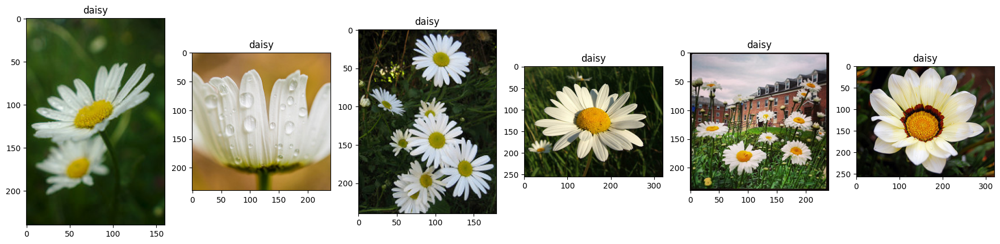

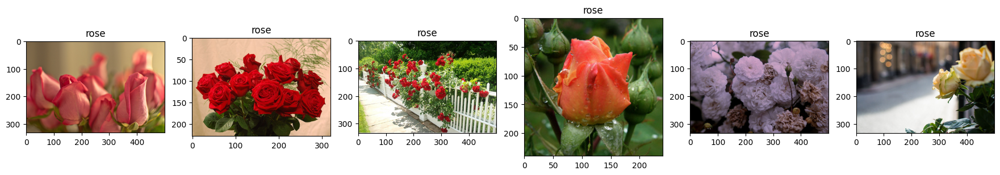

In [26]:
import matplotlib.pyplot as plt
from PIL import Image

# visualize images
def show_grid_images(image_paths, labels, ncols=6):
    figure, axs = plt.subplots(figsize=(22, 6), nrows=1, ncols=ncols)
    for i in range(ncols):
        image = Image.open(image_paths[i])
        axs[i].imshow(image)
        axs[i].set_title(labels[i])

daisy_image_paths = data_df[data_df['label']=='daisy']['path'].iloc[:6].tolist()
daisy_labels = data_df[data_df['label']=='daisy']['label'].iloc[:6].tolist()
show_grid_images(daisy_image_paths, daisy_labels, ncols=6)

rose_image_paths = data_df[data_df['label']=='rose']['path'].iloc[:6].tolist()
rose_labels = data_df[data_df['label']=='rose']['label'].iloc[:6].tolist()
show_grid_images(rose_image_paths, rose_labels, ncols=6)

### Create DataLoader

In [27]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
from PIL import Image

class FlowerDataset(Dataset):
    def __init__(self, image_paths, targets=None, transform=None):
        self.image_paths = image_paths
        self.targets = targets
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
        
    def __getitem__(self, idx):
        pil_image = Image.open(self.image_paths[idx])
        image = self.transform(pil_image)
        
        if self.targets is not None:
            target = torch.tensor(self.targets[idx])
            return image, target
        else:
            return image

In [28]:
from torch.utils.data import DataLoader
from torchvision import transforms as T

BATCH_SIZE = 32

def create_tr_val_loader(tr_df, val_df, tr_transform, val_transform):
    tr_dataset = FlowerDataset(image_paths = tr_df['path'].to_list(),
                               targets= tr_df['target'].to_list(), transform = tr_transform)
    val_dataset = FlowerDataset(image_paths = val_df['path'].to_list(),
                               targets = val_df['target'].to_list(), transform = val_transform)
    tr_loader = DataLoader(tr_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=2*BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)
    return tr_loader, val_loader

In [29]:
IMG_SIZE = 224
IMG_MEANS = [0.485, 0.456, 0.406] 
IMG_STD = [0.229, 0.224, 0.225] 

tr_transform = T.Compose([
            T.Resize(size=(IMG_SIZE, IMG_SIZE)),
            T.ToTensor(), T.Normalize(mean=IMG_MEANS, std=IMG_STD)
])

val_transform = T.Compose([
            T.Resize(size=(IMG_SIZE, IMG_SIZE)),
            T.ToTensor(), T.Normalize(mean=IMG_MEANS, std=IMG_STD)
])

tr_loader, val_loader = create_tr_val_loader(tr_df=tr_df, val_df=val_df,
                                             tr_transform=tr_transform, val_transform=val_transform)
images, labels = next(iter(tr_loader))
print(images.shape, labels.shape)

torch.Size([32, 3, 224, 224]) torch.Size([32])


### Training and Evaluating the Model

* Create a pretrained ResNet-50 model from **torchvision**.
* Apply different types of **augmentations** to the dataset and compare performance.


In [30]:
import torch
import torch.nn as nn
from torchvision import models

def create_resnet_model(model_name, num_classes=10, weights='DEFAULT'):
    model = None
    if model_name == 'resnet50':
        model = models.resnet50(weights=weights)
    elif model_name == 'resnet101':
        model = models.resnet101(weights=weights)
    
    num_in_features = model.fc.in_features
    model.fc = nn.Linear(in_features=num_in_features, out_features=num_classes)

    return model
    
resnet_model = create_resnet_model('resnet50', num_classes=5, weights='DEFAULT') #resnet50, resnet101

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 197MB/s]


### Creating and Applying the Trainer Class

* Download the **Trainer** class from [this link](https://raw.githubusercontent.com/gayoung-k/cnn-learning-notes/main/utils.py) and then import it.


In [31]:

!rm -rf ./modular/v1
!mkdir -p ./modular/v1
!wget -O ./modular/v1/utils.py https://raw.githubusercontent.com/gayoung-k/cnn-learning-notes/main/utils.py
!ls ./modular/v1


--2025-09-03 17:14:12--  https://raw.githubusercontent.com/gayoung-k/cnn-learning-notes/main/utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13084 (13K) [text/plain]
Saving to: ‘./modular/v1/utils.py’

./modular/v1/utils. 100%[===================>]  12.78K  --.-KB/s    in 0s      

2025-09-03 17:14:12 (80.7 MB/s) - ‘./modular/v1/utils.py’ saved [13084/13084]

utils.py


In [32]:
import sys

# system path
sys.path.append('/kaggle/working')

# make sure the following code is working
from modular.v1.utils import Trainer, Predictor, ModelCheckpoint, EarlyStopping

In [33]:
import torch
import torch.nn as nn
from torch.optim import SGD, Adam
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau

# 5 types of flowers
NUM_CLASSES = 5

def train_flowers_with_aug(tr_df, val_df, tr_transform, val_transform, epochs=20):
    tr_loader, val_loader = create_tr_val_loader(tr_df=tr_df, val_df=val_df, 
                                                 tr_transform=tr_transform, val_transform=val_transform)
    model = create_resnet_model('resnet50', num_classes=NUM_CLASSES, weights='DEFAULT')
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    optimizer = Adam(model.parameters(), lr=0.001)
    loss_fn = nn.CrossEntropyLoss()
    # StepLR is chosen to apply a fixed learning rate pattern for easier comparison of different augmentations.
    scheduler = StepLR(optimizer, step_size=5, gamma=0.5)
    # callbacks is set to None
    trainer = Trainer(model=model, loss_fn=loss_fn, optimizer=optimizer,
                      train_loader=tr_loader, val_loader=val_loader, scheduler=scheduler, callbacks=None, 
                      device=device)
    # Training and evaluation
    history = trainer.fit(epochs)
    # Return the trained trainer and history
    return trainer, history


#### Training and evaluation using transforms without augmentation


In [34]:
IMG_SIZE = 224
IMG_MEANS = [0.485, 0.456, 0.406] 
IMG_STD = [0.229, 0.224, 0.225] 
tr_transform = T.Compose([
            T.Resize(size=(IMG_SIZE, IMG_SIZE)),
            T.ToTensor(), T.Normalize(mean=IMG_MEANS, std=IMG_STD)
])

val_transform = T.Compose([
            T.Resize(size=(IMG_SIZE, IMG_SIZE)),
            T.ToTensor(), T.Normalize(mean=IMG_MEANS, std=IMG_STD)
])

trainer, history = train_flowers_with_aug(tr_df, val_df, 
                                          tr_transform=tr_transform, val_transform=val_transform,
                                          epochs=20)

Epoch 1 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  4.61it/s, Loss=0.581, Accuracy=0.842]


Epoch 1/20, Train Loss: 0.6233 Train Accuracy: 0.7917 , Val Loss: 0.5809 Val Accuracy: 0.8424 , Current lr:0.001000


Epoch 2 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.81it/s, Loss=0.401, Accuracy=0.85]


Epoch 2/20, Train Loss: 0.3340 Train Accuracy: 0.8866 , Val Loss: 0.4007 Val Accuracy: 0.8502 , Current lr:0.001000


Epoch 3 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.71it/s, Loss=0.477, Accuracy=0.825]


Epoch 3/20, Train Loss: 0.2772 Train Accuracy: 0.9124 , Val Loss: 0.4772 Val Accuracy: 0.8249 , Current lr:0.001000


Epoch 4 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.94it/s, Loss=0.391, Accuracy=0.877]


Epoch 4/20, Train Loss: 0.2608 Train Accuracy: 0.9124 , Val Loss: 0.3908 Val Accuracy: 0.8774 , Current lr:0.001000


Epoch 5 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.88it/s, Loss=0.515, Accuracy=0.891]


Epoch 5/20, Train Loss: 0.1952 Train Accuracy: 0.9372 , Val Loss: 0.5154 Val Accuracy: 0.8911 , Current lr:0.000500


Epoch 6 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.47it/s, Loss=0.239, Accuracy=0.928]


Epoch 6/20, Train Loss: 0.0773 Train Accuracy: 0.9771 , Val Loss: 0.2389 Val Accuracy: 0.9280 , Current lr:0.000500


Epoch 7 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.19it/s, Loss=0.856, Accuracy=0.92]


Epoch 7/20, Train Loss: 0.0206 Train Accuracy: 0.9961 , Val Loss: 0.8563 Val Accuracy: 0.9202 , Current lr:0.000500


Epoch 8 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.68it/s, Loss=0.691, Accuracy=0.934]


Epoch 8/20, Train Loss: 0.0209 Train Accuracy: 0.9951 , Val Loss: 0.6905 Val Accuracy: 0.9339 , Current lr:0.000500


Epoch 9 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.73it/s, Loss=0.593, Accuracy=0.924]


Epoch 9/20, Train Loss: 0.0633 Train Accuracy: 0.9805 , Val Loss: 0.5932 Val Accuracy: 0.9241 , Current lr:0.000500


Epoch 10 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.77it/s, Loss=0.678, Accuracy=0.907]


Epoch 10/20, Train Loss: 0.0428 Train Accuracy: 0.9864 , Val Loss: 0.6781 Val Accuracy: 0.9066 , Current lr:0.000250


Epoch 11 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.80it/s, Loss=0.591, Accuracy=0.926]


Epoch 11/20, Train Loss: 0.0090 Train Accuracy: 0.9985 , Val Loss: 0.5911 Val Accuracy: 0.9261 , Current lr:0.000250


Epoch 12 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.90it/s, Loss=0.768, Accuracy=0.924]


Epoch 12/20, Train Loss: 0.0037 Train Accuracy: 1.0000 , Val Loss: 0.7685 Val Accuracy: 0.9241 , Current lr:0.000250


Epoch 13 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.49it/s, Loss=0.773, Accuracy=0.944]


Epoch 13/20, Train Loss: 0.0046 Train Accuracy: 0.9995 , Val Loss: 0.7732 Val Accuracy: 0.9436 , Current lr:0.000250


Epoch 14 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.72it/s, Loss=0.786, Accuracy=0.938]


Epoch 14/20, Train Loss: 0.0028 Train Accuracy: 1.0000 , Val Loss: 0.7864 Val Accuracy: 0.9377 , Current lr:0.000250


Epoch 15 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.80it/s, Loss=0.798, Accuracy=0.938]


Epoch 15/20, Train Loss: 0.0029 Train Accuracy: 0.9995 , Val Loss: 0.7983 Val Accuracy: 0.9377 , Current lr:0.000125


Epoch 16 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.91it/s, Loss=0.796, Accuracy=0.944]


Epoch 16/20, Train Loss: 0.0102 Train Accuracy: 0.9995 , Val Loss: 0.7957 Val Accuracy: 0.9436 , Current lr:0.000125


Epoch 17 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.90it/s, Loss=0.868, Accuracy=0.928]


Epoch 17/20, Train Loss: 0.0034 Train Accuracy: 0.9990 , Val Loss: 0.8676 Val Accuracy: 0.9280 , Current lr:0.000125


Epoch 18 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.81it/s, Loss=0.825, Accuracy=0.94]


Epoch 18/20, Train Loss: 0.0018 Train Accuracy: 1.0000 , Val Loss: 0.8251 Val Accuracy: 0.9397 , Current lr:0.000125


Epoch 19 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.73it/s, Loss=0.781, Accuracy=0.932]


Epoch 19/20, Train Loss: 0.0019 Train Accuracy: 1.0000 , Val Loss: 0.7810 Val Accuracy: 0.9319 , Current lr:0.000125


Epoch 20 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.77it/s, Loss=0.782, Accuracy=0.938]

Epoch 20/20, Train Loss: 0.0057 Train Accuracy: 0.9990 , Val Loss: 0.7825 Val Accuracy: 0.9377 , Current lr:0.000063


In [35]:
from modular.v1.utils import Predictor

test_image_paths = test_df['path'].to_list()
test_targets = test_df['target'].to_list()

IMG_SIZE=224
test_transform = T.Compose([
                        T.Resize(size=(IMG_SIZE, IMG_SIZE)),
                        T.ToTensor(), 
                        T.Normalize(mean=[0.485, 0.456, 0.406], 
                                    std=[0.229, 0.224, 0.225])
])

test_dataset = FlowerDataset(image_paths=test_image_paths, 
                            targets=test_targets, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)

trained_model = trainer.get_trained_model()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
predictor = Predictor(model=trained_model, device=device)
eval_metric = predictor.evaluate(test_loader)
print(f'test dataset evaluation:{eval_metric:.4f}')

[Evaluating]: 100%|██████████| 35/35 [00:03<00:00, 11.24it/s, Accuracy=0.925]

test dataset evaluation:0.9246


### Training and evaluation with augmentation applied - 01

* Only Flip transformations applied


In [36]:
tr_transform_aug_01 = T.Compose([
            T.RandomHorizontalFlip(0.5),
            T.RandomVerticalFlip(0.5),
            T.Resize(size=(IMG_SIZE, IMG_SIZE)),
            T.ToTensor(), T.Normalize(mean=IMG_MEANS, std=IMG_STD)
])

trainer, history = train_flowers_with_aug(tr_df=tr_df, val_df=val_df, 
                                          tr_transform=tr_transform_aug_01, val_transform=val_transform,
                                          epochs=20)

Epoch 1 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.63it/s, Loss=0.963, Accuracy=0.722]


Epoch 1/20, Train Loss: 0.6354 Train Accuracy: 0.7849 , Val Loss: 0.9629 Val Accuracy: 0.7218 , Current lr:0.001000


Epoch 2 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.62it/s, Loss=0.472, Accuracy=0.858]


Epoch 2/20, Train Loss: 0.4519 Train Accuracy: 0.8535 , Val Loss: 0.4721 Val Accuracy: 0.8580 , Current lr:0.001000


Epoch 3 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.63it/s, Loss=0.312, Accuracy=0.897]


Epoch 3/20, Train Loss: 0.3259 Train Accuracy: 0.8832 , Val Loss: 0.3120 Val Accuracy: 0.8969 , Current lr:0.001000


Epoch 4 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.56it/s, Loss=0.597, Accuracy=0.804]


Epoch 4/20, Train Loss: 0.2465 Train Accuracy: 0.9182 , Val Loss: 0.5966 Val Accuracy: 0.8035 , Current lr:0.001000


Epoch 5 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.58it/s, Loss=0.564, Accuracy=0.827]


Epoch 5/20, Train Loss: 0.2736 Train Accuracy: 0.9119 , Val Loss: 0.5637 Val Accuracy: 0.8268 , Current lr:0.000500


Epoch 6 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.58it/s, Loss=0.237, Accuracy=0.926]


Epoch 6/20, Train Loss: 0.1557 Train Accuracy: 0.9440 , Val Loss: 0.2367 Val Accuracy: 0.9261 , Current lr:0.000500


Epoch 7 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.71it/s, Loss=0.235, Accuracy=0.907]


Epoch 7/20, Train Loss: 0.0975 Train Accuracy: 0.9650 , Val Loss: 0.2351 Val Accuracy: 0.9066 , Current lr:0.000500


Epoch 8 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.66it/s, Loss=0.229, Accuracy=0.93]


Epoch 8/20, Train Loss: 0.0648 Train Accuracy: 0.9835 , Val Loss: 0.2293 Val Accuracy: 0.9300 , Current lr:0.000500


Epoch 9 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.39it/s, Loss=0.21, Accuracy=0.932]


Epoch 9/20, Train Loss: 0.1077 Train Accuracy: 0.9655 , Val Loss: 0.2103 Val Accuracy: 0.9319 , Current lr:0.000500


Epoch 10 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.67it/s, Loss=0.397, Accuracy=0.922]


Epoch 10/20, Train Loss: 0.0781 Train Accuracy: 0.9727 , Val Loss: 0.3975 Val Accuracy: 0.9222 , Current lr:0.000250


Epoch 11 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.66it/s, Loss=0.186, Accuracy=0.942]


Epoch 11/20, Train Loss: 0.0362 Train Accuracy: 0.9878 , Val Loss: 0.1864 Val Accuracy: 0.9416 , Current lr:0.000250


Epoch 12 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.65it/s, Loss=0.191, Accuracy=0.94]


Epoch 12/20, Train Loss: 0.0162 Train Accuracy: 0.9966 , Val Loss: 0.1912 Val Accuracy: 0.9397 , Current lr:0.000250


Epoch 13 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.69it/s, Loss=0.205, Accuracy=0.938]


Epoch 13/20, Train Loss: 0.0179 Train Accuracy: 0.9937 , Val Loss: 0.2046 Val Accuracy: 0.9377 , Current lr:0.000250


Epoch 14 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.56it/s, Loss=0.198, Accuracy=0.944]


Epoch 14/20, Train Loss: 0.0124 Train Accuracy: 0.9961 , Val Loss: 0.1983 Val Accuracy: 0.9436 , Current lr:0.000250


Epoch 15 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.64it/s, Loss=0.228, Accuracy=0.934]


Epoch 15/20, Train Loss: 0.0257 Train Accuracy: 0.9912 , Val Loss: 0.2280 Val Accuracy: 0.9339 , Current lr:0.000125


Epoch 16 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.49it/s, Loss=0.195, Accuracy=0.938]


Epoch 16/20, Train Loss: 0.0108 Train Accuracy: 0.9981 , Val Loss: 0.1949 Val Accuracy: 0.9377 , Current lr:0.000125


Epoch 17 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.74it/s, Loss=0.198, Accuracy=0.942]


Epoch 17/20, Train Loss: 0.0137 Train Accuracy: 0.9976 , Val Loss: 0.1981 Val Accuracy: 0.9416 , Current lr:0.000125


Epoch 18 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.80it/s, Loss=0.179, Accuracy=0.942]


Epoch 18/20, Train Loss: 0.0125 Train Accuracy: 0.9961 , Val Loss: 0.1793 Val Accuracy: 0.9416 , Current lr:0.000125


Epoch 19 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.25it/s, Loss=0.167, Accuracy=0.947]


Epoch 19/20, Train Loss: 0.0067 Train Accuracy: 0.9990 , Val Loss: 0.1673 Val Accuracy: 0.9475 , Current lr:0.000125


Epoch 20 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.48it/s, Loss=0.213, Accuracy=0.946]

Epoch 20/20, Train Loss: 0.0080 Train Accuracy: 0.9981 , Val Loss: 0.2126 Val Accuracy: 0.9455 , Current lr:0.000063


In [37]:
trained_model = trainer.get_trained_model()

predictor = Predictor(model=trained_model, device=device)
eval_metric = predictor.evaluate(test_loader)
print(f'test dataset evaluation:{eval_metric:.4f}')

[Evaluating]: 100%|██████████| 35/35 [00:02<00:00, 13.66it/s, Accuracy=0.927]

test dataset evaluation:0.9273


### Training and evaluation with augmentation applied - 02

* Flip, Affine, ColorJitter are applied together


In [38]:
tr_transform_aug_02 = T.Compose([
    T.RandomHorizontalFlip(p=0.3),
    T.RandomVerticalFlip(p=0.3),
    T.RandomApply([T.RandomAffine(degrees=30, translate=(0.1, 0.1),scale=(0.8, 1.2))
                   ], p=0.2),
    T.RandomApply([T.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1)], p=0.3),
    T.Resize(size=(IMG_SIZE, IMG_SIZE)),
    T.ToTensor(), T.Normalize(mean=IMG_MEANS, std=IMG_STD)
    
])

trainer, history = train_flowers_with_aug(tr_df=tr_df, val_df=val_df, 
                                          tr_transform=tr_transform_aug_02, val_transform=val_transform,
                                          epochs=20)

Epoch 1 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.63it/s, Loss=0.527, Accuracy=0.85]


Epoch 1/20, Train Loss: 0.7055 Train Accuracy: 0.7684 , Val Loss: 0.5266 Val Accuracy: 0.8502 , Current lr:0.001000


Epoch 2 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.78it/s, Loss=0.775, Accuracy=0.831]


Epoch 2/20, Train Loss: 0.4239 Train Accuracy: 0.8482 , Val Loss: 0.7753 Val Accuracy: 0.8307 , Current lr:0.001000


Epoch 3 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.78it/s, Loss=0.489, Accuracy=0.856]


Epoch 3/20, Train Loss: 0.4094 Train Accuracy: 0.8628 , Val Loss: 0.4889 Val Accuracy: 0.8560 , Current lr:0.001000


Epoch 4 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.73it/s, Loss=0.378, Accuracy=0.87]


Epoch 4/20, Train Loss: 0.3748 Train Accuracy: 0.8720 , Val Loss: 0.3785 Val Accuracy: 0.8696 , Current lr:0.001000


Epoch 5 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.64it/s, Loss=0.292, Accuracy=0.889]


Epoch 5/20, Train Loss: 0.3425 Train Accuracy: 0.8774 , Val Loss: 0.2918 Val Accuracy: 0.8891 , Current lr:0.000500


Epoch 6 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.48it/s, Loss=0.378, Accuracy=0.914]


Epoch 6/20, Train Loss: 0.1572 Train Accuracy: 0.9450 , Val Loss: 0.3784 Val Accuracy: 0.9144 , Current lr:0.000500


Epoch 7 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.61it/s, Loss=0.294, Accuracy=0.885]


Epoch 7/20, Train Loss: 0.1498 Train Accuracy: 0.9436 , Val Loss: 0.2938 Val Accuracy: 0.8852 , Current lr:0.000500


Epoch 8 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.50it/s, Loss=0.201, Accuracy=0.918]


Epoch 8/20, Train Loss: 0.1346 Train Accuracy: 0.9513 , Val Loss: 0.2013 Val Accuracy: 0.9183 , Current lr:0.000500


Epoch 9 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.59it/s, Loss=0.213, Accuracy=0.92]


Epoch 9/20, Train Loss: 0.1263 Train Accuracy: 0.9611 , Val Loss: 0.2126 Val Accuracy: 0.9202 , Current lr:0.000500


Epoch 10 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.71it/s, Loss=0.218, Accuracy=0.912]


Epoch 10/20, Train Loss: 0.1125 Train Accuracy: 0.9674 , Val Loss: 0.2184 Val Accuracy: 0.9125 , Current lr:0.000250


Epoch 11 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.49it/s, Loss=0.184, Accuracy=0.932]


Epoch 11/20, Train Loss: 0.0903 Train Accuracy: 0.9791 , Val Loss: 0.1843 Val Accuracy: 0.9319 , Current lr:0.000250


Epoch 12 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.55it/s, Loss=0.195, Accuracy=0.926]


Epoch 12/20, Train Loss: 0.0779 Train Accuracy: 0.9747 , Val Loss: 0.1955 Val Accuracy: 0.9261 , Current lr:0.000250


Epoch 13 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.57it/s, Loss=0.178, Accuracy=0.934]


Epoch 13/20, Train Loss: 0.0462 Train Accuracy: 0.9835 , Val Loss: 0.1784 Val Accuracy: 0.9339 , Current lr:0.000250


Epoch 14 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.60it/s, Loss=0.196, Accuracy=0.94]


Epoch 14/20, Train Loss: 0.0379 Train Accuracy: 0.9878 , Val Loss: 0.1964 Val Accuracy: 0.9397 , Current lr:0.000250


Epoch 15 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.59it/s, Loss=0.219, Accuracy=0.936]


Epoch 15/20, Train Loss: 0.0304 Train Accuracy: 0.9903 , Val Loss: 0.2192 Val Accuracy: 0.9358 , Current lr:0.000125


Epoch 16 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.53it/s, Loss=0.183, Accuracy=0.94]


Epoch 16/20, Train Loss: 0.0265 Train Accuracy: 0.9927 , Val Loss: 0.1828 Val Accuracy: 0.9397 , Current lr:0.000125


Epoch 17 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.59it/s, Loss=0.179, Accuracy=0.936]


Epoch 17/20, Train Loss: 0.0175 Train Accuracy: 0.9942 , Val Loss: 0.1792 Val Accuracy: 0.9358 , Current lr:0.000125


Epoch 18 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.55it/s, Loss=0.175, Accuracy=0.944]


Epoch 18/20, Train Loss: 0.0244 Train Accuracy: 0.9927 , Val Loss: 0.1746 Val Accuracy: 0.9436 , Current lr:0.000125


Epoch 19 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.54it/s, Loss=0.208, Accuracy=0.938]


Epoch 19/20, Train Loss: 0.0256 Train Accuracy: 0.9917 , Val Loss: 0.2076 Val Accuracy: 0.9377 , Current lr:0.000125


Epoch 20 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.59it/s, Loss=0.203, Accuracy=0.938]

Epoch 20/20, Train Loss: 0.0140 Train Accuracy: 0.9946 , Val Loss: 0.2029 Val Accuracy: 0.9377 , Current lr:0.000063


In [39]:
trained_model = trainer.get_trained_model()

predictor = Predictor(model=trained_model, device=device)
eval_metric = predictor.evaluate(test_loader)
print(f'test dataset evaluation:{eval_metric:.4f}')

[Evaluating]: 100%|██████████| 35/35 [00:02<00:00, 13.46it/s, Accuracy=0.93]

test dataset evaluation:0.9301


### Training and evaluation with augmentation applied - 03

* Applying CenterCrop (RandomResizedCrop). Crop transformations are considered strong augmentations. They can yield good results, but depending on the image characteristics, performance may also degrade.


In [40]:
tr_transform_aug_03 = T.Compose([
    T.RandomHorizontalFlip(p=0.3),
    T.RandomVerticalFlip(p=0.3),
    T.RandomApply([T.CenterCrop(size=(200,200))], p=0.4),
    T.Resize(size=(IMG_SIZE, IMG_SIZE)),
    T.ToTensor(), T.Normalize(mean=IMG_MEANS, std=IMG_STD)
    
])

trainer, history = train_flowers_with_aug(tr_df=tr_df, val_df=val_df, 
                                          tr_transform=tr_transform_aug_03, val_transform=val_transform,
                                          epochs=20)

Epoch 1 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.58it/s, Loss=0.41, Accuracy=0.864]


Epoch 1/20, Train Loss: 0.6138 Train Accuracy: 0.7981 , Val Loss: 0.4102 Val Accuracy: 0.8638 , Current lr:0.001000


Epoch 2 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.53it/s, Loss=0.985, Accuracy=0.815]


Epoch 2/20, Train Loss: 0.4276 Train Accuracy: 0.8516 , Val Loss: 0.9854 Val Accuracy: 0.8152 , Current lr:0.001000


Epoch 3 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.53it/s, Loss=0.332, Accuracy=0.893]


Epoch 3/20, Train Loss: 0.3963 Train Accuracy: 0.8662 , Val Loss: 0.3321 Val Accuracy: 0.8930 , Current lr:0.001000


Epoch 4 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.73it/s, Loss=0.973, Accuracy=0.87]


Epoch 4/20, Train Loss: 0.3060 Train Accuracy: 0.8934 , Val Loss: 0.9725 Val Accuracy: 0.8696 , Current lr:0.001000


Epoch 5 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.48it/s, Loss=0.535, Accuracy=0.844]


Epoch 5/20, Train Loss: 0.2922 Train Accuracy: 0.8968 , Val Loss: 0.5350 Val Accuracy: 0.8444 , Current lr:0.000500


Epoch 6 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.52it/s, Loss=0.225, Accuracy=0.924]


Epoch 6/20, Train Loss: 0.1858 Train Accuracy: 0.9382 , Val Loss: 0.2246 Val Accuracy: 0.9241 , Current lr:0.000500


Epoch 7 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.55it/s, Loss=0.269, Accuracy=0.918]


Epoch 7/20, Train Loss: 0.1223 Train Accuracy: 0.9611 , Val Loss: 0.2694 Val Accuracy: 0.9183 , Current lr:0.000500


Epoch 8 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.59it/s, Loss=0.224, Accuracy=0.922]


Epoch 8/20, Train Loss: 0.1058 Train Accuracy: 0.9601 , Val Loss: 0.2242 Val Accuracy: 0.9222 , Current lr:0.000500


Epoch 9 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.58it/s, Loss=0.648, Accuracy=0.893]


Epoch 9/20, Train Loss: 0.1244 Train Accuracy: 0.9606 , Val Loss: 0.6481 Val Accuracy: 0.8930 , Current lr:0.000500


Epoch 10 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.53it/s, Loss=0.284, Accuracy=0.912]


Epoch 10/20, Train Loss: 0.1200 Train Accuracy: 0.9596 , Val Loss: 0.2839 Val Accuracy: 0.9125 , Current lr:0.000250


Epoch 11 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.57it/s, Loss=0.331, Accuracy=0.928]


Epoch 11/20, Train Loss: 0.0654 Train Accuracy: 0.9757 , Val Loss: 0.3306 Val Accuracy: 0.9280 , Current lr:0.000250


Epoch 12 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.53it/s, Loss=0.224, Accuracy=0.934]


Epoch 12/20, Train Loss: 0.0469 Train Accuracy: 0.9864 , Val Loss: 0.2237 Val Accuracy: 0.9339 , Current lr:0.000250


Epoch 13 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.61it/s, Loss=0.196, Accuracy=0.93]


Epoch 13/20, Train Loss: 0.0320 Train Accuracy: 0.9912 , Val Loss: 0.1962 Val Accuracy: 0.9300 , Current lr:0.000250


Epoch 14 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.56it/s, Loss=0.211, Accuracy=0.926]


Epoch 14/20, Train Loss: 0.0358 Train Accuracy: 0.9908 , Val Loss: 0.2107 Val Accuracy: 0.9261 , Current lr:0.000250


Epoch 15 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.67it/s, Loss=0.224, Accuracy=0.934]


Epoch 15/20, Train Loss: 0.0340 Train Accuracy: 0.9912 , Val Loss: 0.2235 Val Accuracy: 0.9339 , Current lr:0.000125


Epoch 16 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.71it/s, Loss=0.189, Accuracy=0.946]


Epoch 16/20, Train Loss: 0.0319 Train Accuracy: 0.9893 , Val Loss: 0.1895 Val Accuracy: 0.9455 , Current lr:0.000125


Epoch 17 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.70it/s, Loss=0.177, Accuracy=0.947]


Epoch 17/20, Train Loss: 0.0253 Train Accuracy: 0.9932 , Val Loss: 0.1775 Val Accuracy: 0.9475 , Current lr:0.000125


Epoch 18 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.60it/s, Loss=0.178, Accuracy=0.947]


Epoch 18/20, Train Loss: 0.0203 Train Accuracy: 0.9932 , Val Loss: 0.1779 Val Accuracy: 0.9475 , Current lr:0.000125


Epoch 19 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.57it/s, Loss=0.178, Accuracy=0.951]


Epoch 19/20, Train Loss: 0.0237 Train Accuracy: 0.9927 , Val Loss: 0.1782 Val Accuracy: 0.9514 , Current lr:0.000125


Epoch 20 [Validating]: 100%|██████████| 9/9 [00:01<00:00,  5.61it/s, Loss=0.179, Accuracy=0.947]

Epoch 20/20, Train Loss: 0.0252 Train Accuracy: 0.9956 , Val Loss: 0.1795 Val Accuracy: 0.9475 , Current lr:0.000063


In [41]:
trained_model = trainer.get_trained_model()

predictor = Predictor(model=trained_model, device=device)
eval_metric = predictor.evaluate(test_loader)
print(f'test dataset evaluation:{eval_metric:.4f}')

[Evaluating]: 100%|██████████| 35/35 [00:02<00:00, 13.54it/s, Accuracy=0.941]

test dataset evaluation:0.9410
